In [1]:
# Third party modules
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [2]:
def get_image(image_path):
    """Get a numpy array of an image so that one can access values[x][y]."""
    image = Image.open(image_path, "r")
    width, height = image.size
    pixel_values = list(image.getdata())
    if image.mode == "RGB":
        channels = 3
    elif image.mode == "L":
        channels = 1
    else:
        print("Unknown mode: %s" % image.mode)
        return None
    pixel_values = np.array(pixel_values).reshape((width, height, channels))
    return pixel_values

def displayImage(image):
    plt.imshow(image)
    plt.show()

In [16]:
#image = get_image("DSC_0024.png") # Can be many different formats.
image = get_image("DSC_0024.jpg") # Can be many different formats.

In [17]:
print(image[0])
print(image.shape)

[[13 14  0]
 [15 12  0]
 [18 13  0]
 ...
 [ 4  3  8]
 [ 4  3  8]
 [ 4  4  6]]
(6000, 4000, 3)


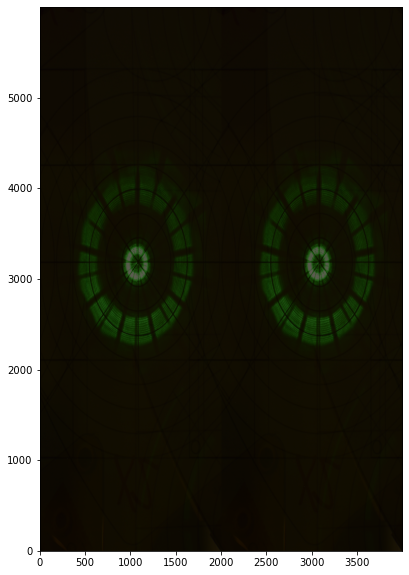

In [18]:
plt.figure(figsize=(15,10))
plt.imshow(image,origin='lower')
plt.show()

In [2]:
from matplotlib import image as mpimg
image = mpimg.imread("DSC_0024.jpg")

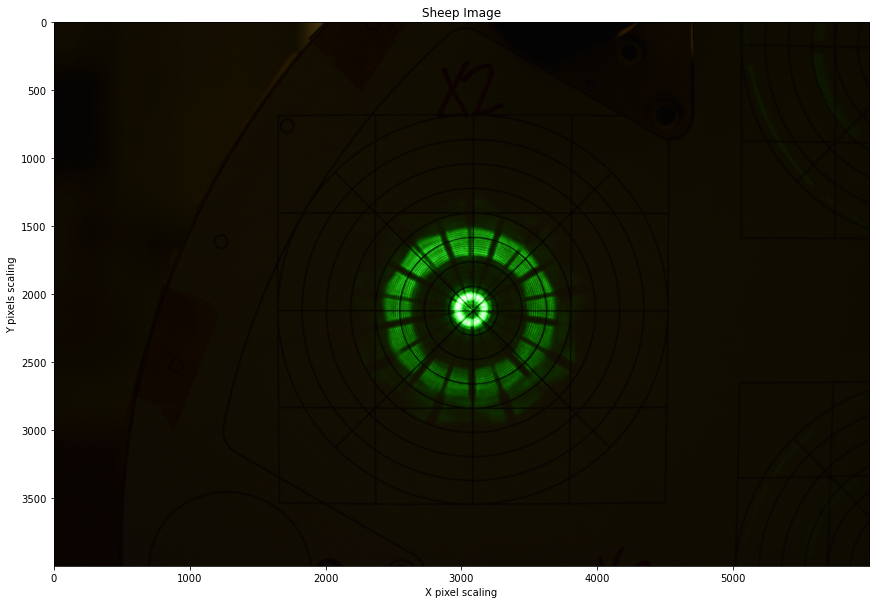

In [51]:
image2 = np.copy(image)
#image2[:,:,0] = 0
plt.figure(figsize=(15,10))
plt.title("Sheep Image")
plt.xlabel("X pixel scaling")
plt.ylabel("Y pixels scaling")
plt.imshow(image2)
plt.show()

In [25]:
np.shape(image)

(4000, 6000, 3)

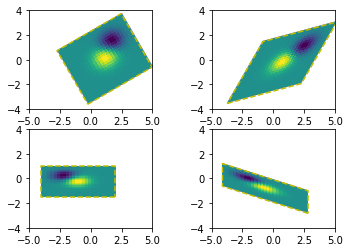

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.transforms as mtransforms


def get_image():
    delta = 0.25
    x = y = np.arange(-3.0, 3.0, delta)
    X, Y = np.meshgrid(x, y)
    Z1 = np.exp(-X**2 - Y**2)
    Z2 = np.exp(-(X - 1)**2 - (Y - 1)**2)
    Z = (Z1 - Z2)
    return Z


def do_plot(ax, Z, transform):
    im = ax.imshow(Z, interpolation='none',
                   origin='lower',
                   extent=[-2, 4, -3, 2], clip_on=True)

    trans_data = transform + ax.transData
    im.set_transform(trans_data)

    # display intended extent of the image
    x1, x2, y1, y2 = im.get_extent()
    ax.plot([x1, x2, x2, x1, x1], [y1, y1, y2, y2, y1], "y--",
            transform=trans_data)
    ax.set_xlim(-5, 5)
    ax.set_ylim(-4, 4)


# prepare image and figure
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)
Z = get_image()

# image rotation
do_plot(ax1, Z, mtransforms.Affine2D().rotate_deg(30))

# image skew
do_plot(ax2, Z, mtransforms.Affine2D().skew_deg(30, 15))

# scale and reflection
do_plot(ax3, Z, mtransforms.Affine2D().scale(-1, .5))

# everything and a translation
do_plot(ax4, Z, mtransforms.Affine2D().
        rotate_deg(30).skew_deg(30, 15).scale(-1, .5).translate(.5, -1))

plt.show()

In [38]:
Z

array([[ 1.52299671e-08,  6.41205218e-08,  2.38236428e-07,
         7.81146030e-07,  2.26031552e-06,  5.77189487e-06,
         1.30070804e-05,  2.58673879e-05,  4.53978686e-05,
         7.03115234e-05,  9.60997909e-05,  1.15909193e-04,
         1.23368405e-04,  1.15868661e-04,  9.60240096e-05,
         7.02110698e-05,  4.52873946e-05,  2.57623832e-05,
         1.29196552e-05,  5.70783274e-06,  2.21893003e-06,
         7.57560287e-07,  2.26375847e-07,  5.88572696e-08],
       [ 6.41205218e-08,  2.69957240e-07,  1.00301136e-06,
         3.28873967e-06,  9.51624585e-06,  2.43004254e-05,
         5.47612606e-05,  1.08903825e-04,  1.91126536e-04,
         2.96008195e-04,  4.04562837e-04,  4.87931506e-04,
         5.19287314e-04,  4.87650158e-04,  4.04036810e-04,
         2.95310909e-04,  1.90359695e-04,  1.08174948e-04,
         5.41544092e-05,  2.38557460e-05,  9.22897362e-06,
         3.12502217e-06,  9.20682602e-07,  2.33423028e-07],
       [ 2.38236428e-07,  1.00301136e-06,  3.72663027e

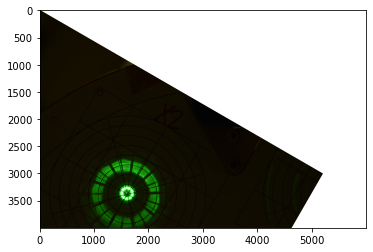

In [39]:
import matplotlib.pyplot as plt
from matplotlib import transforms




fig = plt.figure()
ax = fig.add_subplot(111)

tr = transforms.Affine2D().rotate_deg(30)

ax.imshow(image, transform=tr + ax.transData)
plt.show()

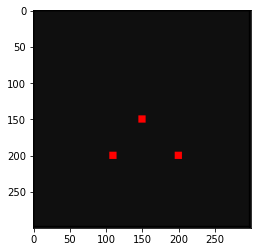

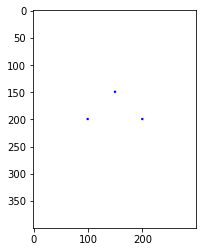

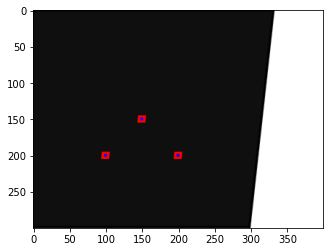

In [49]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Prepare source image
sourcePoints = [[200., 200.], [150., 150.], [110., 200.]]
targetPoints = [[200., 200.], [150., 150.], [100., 200.]]
image = np.empty((300, 300, 3), dtype='uint8')
image[:] = 15
# Mark border for better visibility
image[0:2, :] = 0
image[-3:-1, :] = 0
image[:, 0:2] = 0
image[:, -3:-1] = 0
# Mark source points in red
for sp in sourcePoints:
    sp = [int(u) for u in sp]
    image[sp[1] - 5:sp[1] + 5, sp[0] - 5:sp[0] + 5, :] = np.array([255, 0, 0])

# Show image
fig = plt.figure()
plt.imshow(image)

# Prepare array in which the image is placed
array = np.empty((400, 300, 3), dtype='uint8')
array[:] = 255
a2 = array.copy()
# Mark target points in blue
for tp in targetPoints:
    tp = [int(u) for u in tp]
    a2[tp[1] - 2:tp[1] + 2, tp[0] - 2:tp[0] + 2] = [0, 0, 255]

# Show array
fig = plt.figure()
plt.imshow(a2)

# Calculate affine matrix and transform image
M = cv2.getAffineTransform(np.float32(sourcePoints), np.float32(targetPoints))
array = cv2.warpAffine(image, M, array.shape[:2], borderValue=[255, 255, 255])

# Mark blue target points in array, expected to be above red source points
for tp in targetPoints:
    tp = [int(u) for u in tp]
    array[tp[1] - 2:tp[1] + 2, tp[0] - 2:tp[0] + 2] = [0, 0, 255]

fig = plt.figure()
plt.imshow(array)

plt.show()

<IPython.core.display.Javascript object>


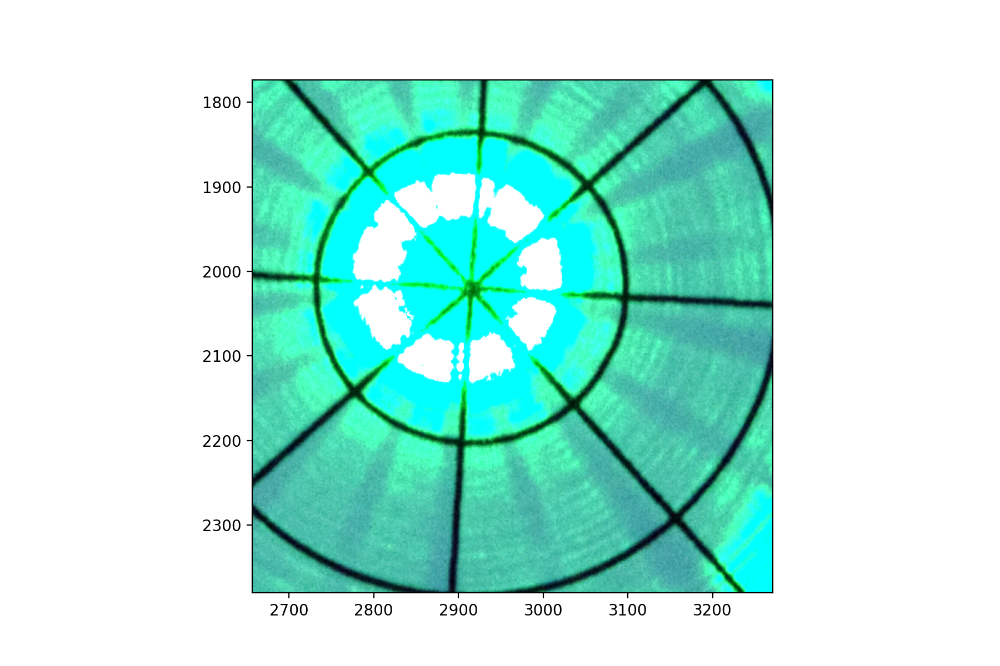

Textarea(value='', description='event:', placeholder='')

In [10]:
import ipywidgets as wdg
import numpy as np
import matplotlib.pyplot as plt
import cv2
# Prepare source image
%matplotlib notebook
image = cv2.imread("skewedtest.png", cv2.IMREAD_UNCHANGED)
image = image[:,:,0:3]
image_fix = image.copy() # 4000,6000,3
a = cv2.convertScaleAbs(image_fix, 1, 10)
fig = plt.figure(figsize=(9,6))
plt.imshow(a)

# Create and display textarea widget
txt = wdg.Textarea(
    value='',
    placeholder='',
    description='event:',
    disabled=False
)
display(txt)

# Define a callback function that will update the textarea
def onclick(event):
    a = str(event)
    txt.value = str(event)  # Dynamically update the text box above

# Create an hard reference to the callback not to be cleared by the garbage collector
ka = fig.canvas.mpl_connect('button_press_event', onclick)



In [13]:
np.shape(image_fix)

(3684, 5526, 3)

<IPython.core.display.Javascript object>


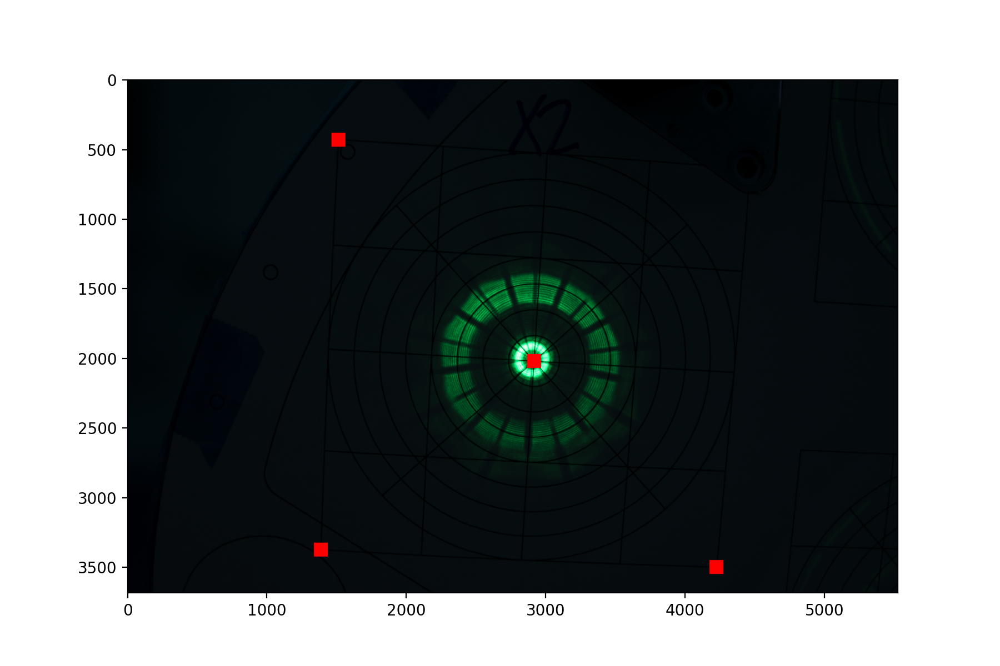

In [45]:
ref = [4470, 620]
sourcePoints = [[1512.1862346012902, 430.00161599609487],
                [1386.3565619657006,3374.0066450819436],[4225.00515452309,3499.1959486898095]]
#sourcePoints = [[1520., 480.],[4200., 3500.], [2900., 2000.], [1400., 3400.]]
sz = np.shape(image_fix)
# Mark source points in red
w = 50
for sp in sourcePoints:
    sp = [int(u) for u in sp]
    image_fix[sp[1] - w:sp[1] + w, sp[0] - w:sp[0] + w, :] = np.array([255, 0, 0])
# Show image
fig = plt.figure(figsize=(9,6))
plt.imshow(image_fix)

<IPython.core.display.Javascript object>


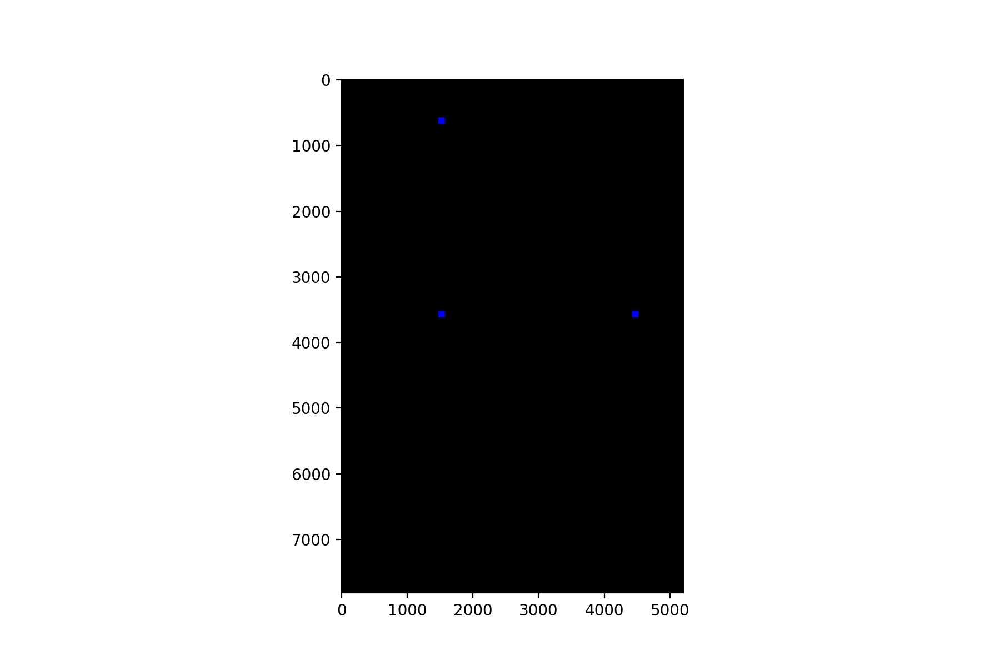

<IPython.core.display.Javascript object>


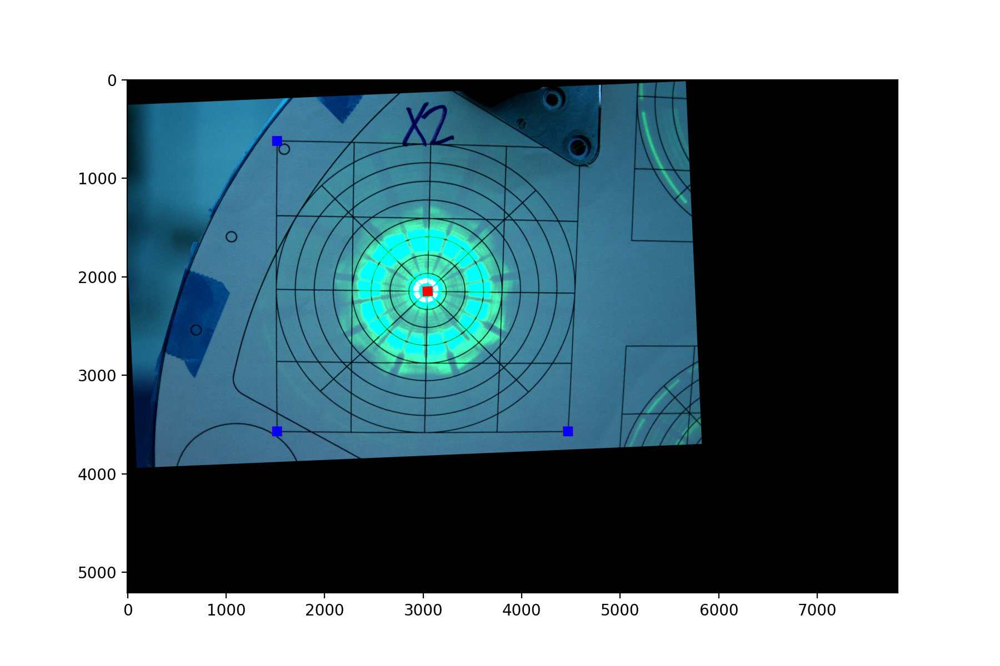

In [48]:
ref = [4470, 620]
targetPoints = [[1520., 620.],[1520,3570],[4470.,3570]]
#targetPoints = [[1520., 480.],[4200., 3400.], [2900., 2000.], [1500., 3400.]]

# Prepare array in which the image is placed
array = np.empty((int(sz[1]*np.sqrt(2)), int(sz[0]*np.sqrt(2)), 3), dtype='uint8')
a2 = array.copy()
# Mark target points in blue
for tp in targetPoints:
    tp = [int(u) for u in tp]
    a2[tp[1] - w:tp[1] + w, tp[0] - w:tp[0] + w] = [0, 0, 255]

# Show array
fig = plt.figure(figsize=(9,6))
plt.imshow(a2)

# Calculate affine matrix and transform image
M = cv2.getAffineTransform(np.float32(sourcePoints), np.float32(targetPoints))
array = cv2.warpAffine(image_fix, M, array.shape[:2], borderValue=[255, 255, 255])

# Mark blue target points in array, expected to be above red source points
for tp in targetPoints:
    tp = [int(u) for u in tp]
    array[tp[1] - w:tp[1] + w, tp[0] - w:tp[0] + w] = [0, 0, 255]

fig = plt.figure(figsize=(9,6))
plt.imshow(cv2.convertScaleAbs(array, 1, 10))

plt.show()

<IPython.core.display.Javascript object>


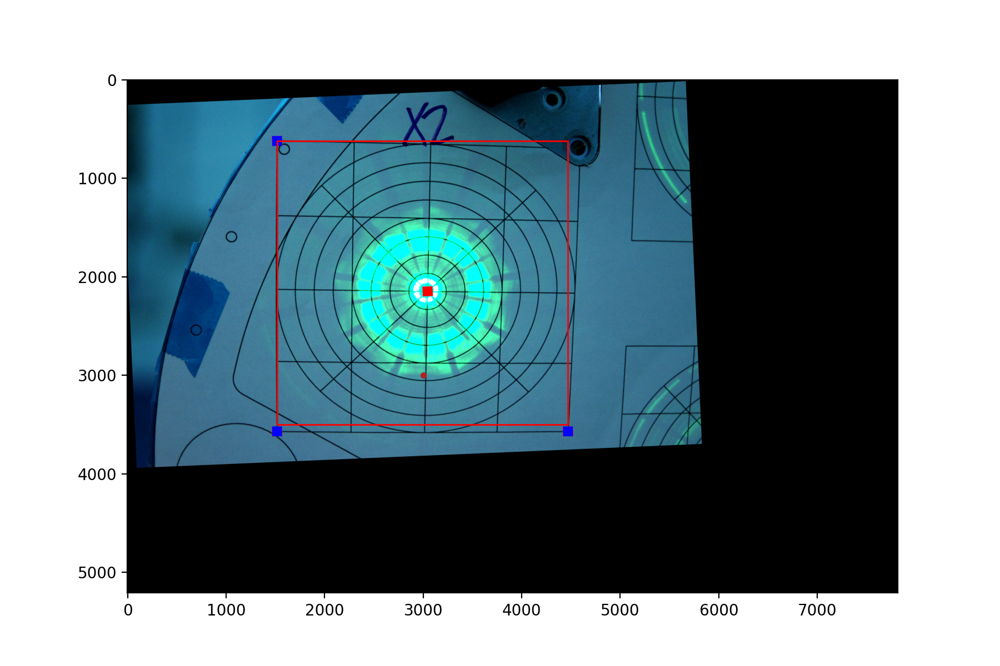

In [49]:

fig, ax = plt.subplots(figsize=(9,6))
plt.imshow(cv2.convertScaleAbs(array, 1, 10))

import matplotlib.patches as patches
# Create a Rectangle patch
rect = patches.Rectangle((1520., 620.), 2950, 2880, linewidth=1, edgecolor='r', facecolor='none')

# Add the patch to the Axes
ax.add_patch(rect)
x = np.arange(1)+3000
ax.plot(x, x, '.', linewidth=5, color='firebrick')
plt.show()

In [37]:
x

array([0])

In [81]:
np.shape(im[:,:,0:2])

(3684, 5526, 2)

In [5]:
%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np
import ipywidgets as wdg  # Using the ipython notebook widgets

# Create a random image
a = np.random.poisson(size=(12,15))
fig = plt.figure()
plt.imshow(a)

# Create and display textarea widget
txt = wdg.Textarea(
    value='',
    placeholder='',
    description='Source Points:',
    disabled=False
)
display(txt)

# Define a callback function that will update the textarea
def onclick(event):
    txt.value = str(event)  # Dynamically update the text box above

# Create an hard reference to the callback not to be cleared by the garbage collector
ka = fig.canvas.mpl_connect('button_press_event', onclick)

Textarea(value='', description='Source Points:', placeholder='')

In [3]:
%matplotlib tk
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

fig = plt.figure(figsize=(9,6))


def onclick(event):
    ix, iy = event.xdata, event.ydata
    print(ix, iy)

cid = fig.canvas.mpl_connect('button_press_event', onclick)

imgplot = plt.imshow(image)
plt.show()

349.7164502164502 3673.9588744588746
1433.6991341991343 3421.145021645022
2095.1709956709956 3777.8549783549784
2147.1190476190477 3729.37012987013
1748.8506493506493 3545.8203463203463
1683.0497835497836 3355.344155844156
1901.231601731602 3549.28354978355
1447.5519480519483 3372.660173160173
1570.8896569380443 3596.1097844807523
1559.9100919422247 3590.7811732139758
1556.312527814142 3588.7213739007684
1556.312527814142 3588.7213739007684
1556.312527814142 3588.7213739007684
1556.312527814142 3588.7213739007684
1520.2792207792209 3369.19696969697
1715.8883735312306 3593.7354903393866


In [4]:
cid

8

In [67]:
final_gantry_2_coords

array([[169.474 ,  74.4851],
       [629.474 ,  74.4851],
       [629.474 , 334.4851],
       [169.474 , 334.4851],
       [169.474 ,  74.4851]])

<IPython.core.display.Javascript object>


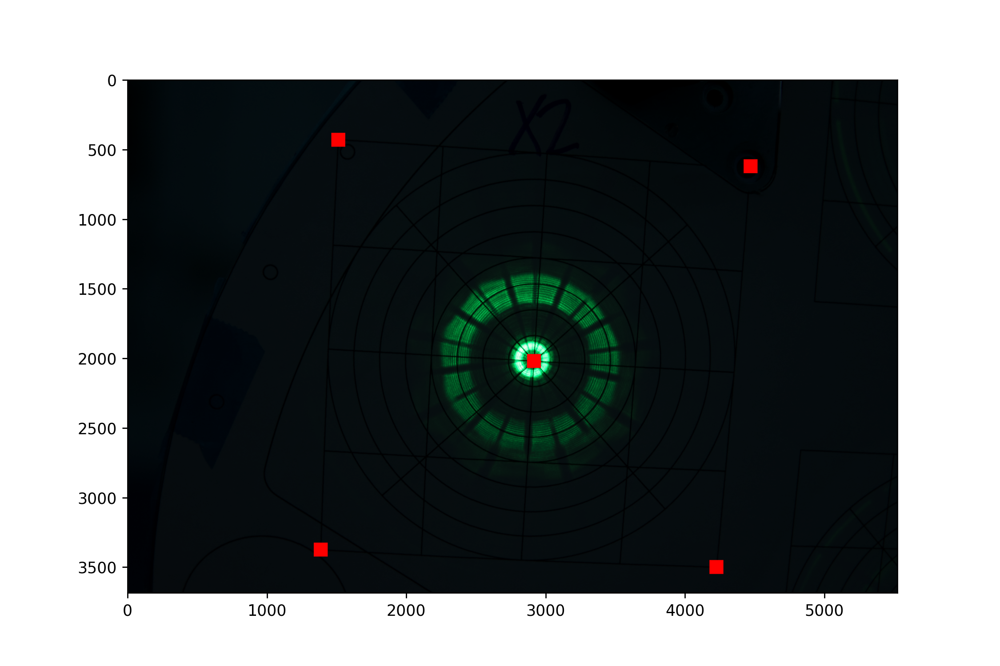

In [69]:
ref = [4470, 620]
sourcePoints = [[4470, 620],[1512.1862346012902, 430.00161599609487],
                [1386.3565619657006,3374.0066450819436],[4225.00515452309,3499.1959486898095]]
#sourcePoints = [[1520., 480.],[4200., 3500.], [2900., 2000.], [1400., 3400.]]
sz = np.shape(image_fix)
# Mark source points in red
w = 50
for sp in sourcePoints:
    sp = [int(u) for u in sp]
    image_fix[sp[1] - w:sp[1] + w, sp[0] - w:sp[0] + w, :] = np.array([255, 0, 0])
# Show image
fig = plt.figure(figsize=(9,6))
plt.imshow(image_fix)

<IPython.core.display.Javascript object>


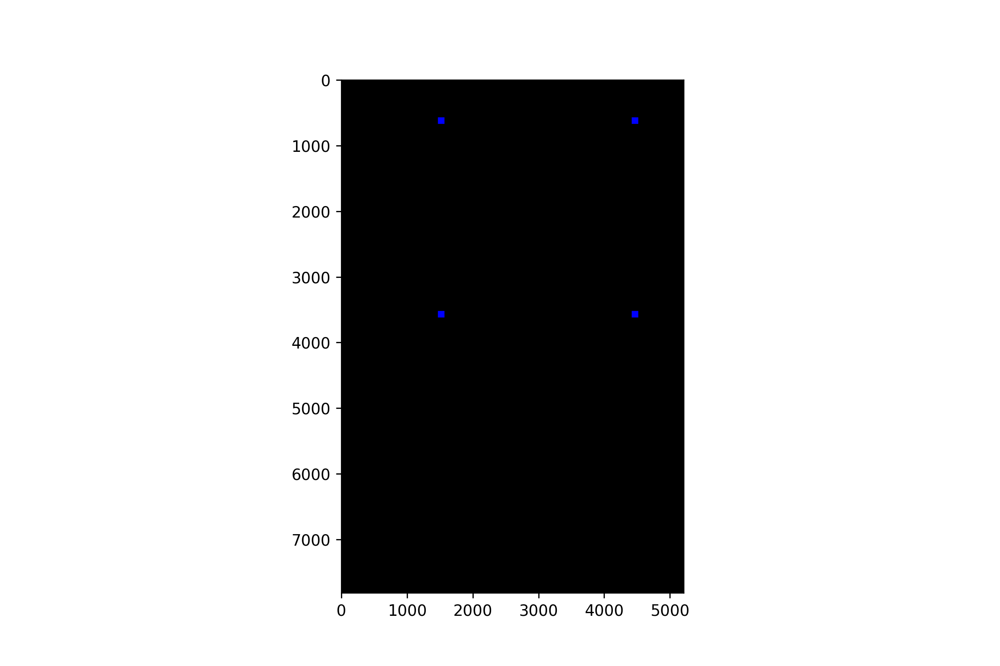

<IPython.core.display.Javascript object>


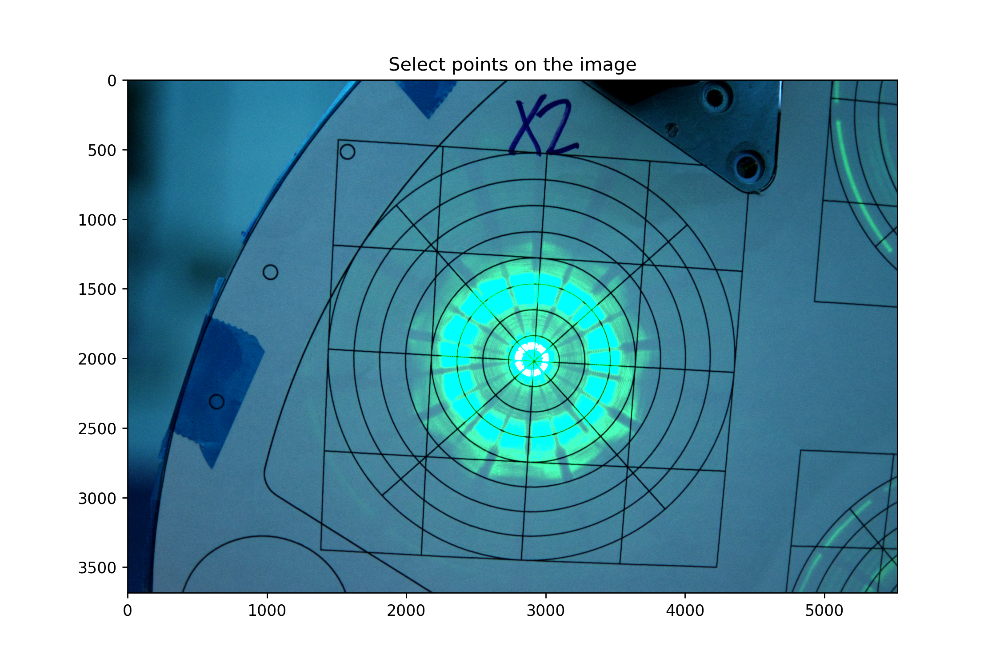

In [79]:
targetPoints = [[4470, 620],[1520., 620.],[1520,3570],[4470.,3570]]
#targetPoints = [[1520., 480.],[4200., 3400.], [2900., 2000.], [1500., 3400.]]

# Prepare array in which the image is placed
array = np.empty((int(sz[1]*np.sqrt(2)), int(sz[0]*np.sqrt(2)), 3), dtype='uint8')
a2 = array.copy()
# Mark target points in blue
for tp in targetPoints:
    tp = [int(u) for u in tp]
    a2[tp[1] - w:tp[1] + w, tp[0] - w:tp[0] + w] = [0, 0, 255]

# Show array
fig = plt.figure(figsize=(9,6))
plt.imshow(a2)

# Calculate affine matrix and transform image
M, mask = cv2.findHomography(np.float32(sourcePoints), np.float32(targetPoints))
dst = cv2.warpPerspective(image_fix, M,array.shape[:2]) 

#array = cv2.warpAffine(image_fix, M, array.shape[:2], borderValue=[255, 255, 255])

# Mark blue target points in array, expected to be above red source points
for tp in targetPoints:
    tp = [int(u) for u in tp]
    array[tp[1] - w:tp[1] + w, tp[0] - w:tp[0] + w] = [0, 0, 255]

fig = plt.figure(figsize=(9,6))
plt.imshow(cv2.convertScaleAbs(dst, 1, 10))

plt.show()


In [ ]:
# Convert the image to grayscale
gray_image = cv2.cvtColor(image_final, cv2.COLOR_BGR2GRAY)

# Apply binary thresholding to convert black pixels to white
_, image_thresh = cv2.threshold(gray_image, 100, 255, cv2.THRESH_BINARY)

fig, ax = plt.subplots(figsize=(9,6))
ax.imshow(image_thresh)
ax.set_title("FOXSI: Projected Grid")
ax.axis('on')
plt.show()
# Preprocess the image
gray = cv2.cvtColor(image_final, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)
#Detect edges
edges = cv2.Canny(blurred, 15, 50)
# Apply Hough Circle Transform
circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1, minDist=5, param1=50, param2=50, minRadius=50, maxRadius=1000)


fig, ax = plt.subplots(figsize=(9,6))
ax.imshow(edges)
ax.set_title("FOXSI: Projected Grid")
ax.axis('off')
plt.show()

if circles is not None:
    circles = np.round(circles[0, :]).astype("int")

    for (x, y, r) in circles:
        # Draw the circle on the original image
        circle = plt.Circle((x, y), r, color='red', linewidth=2, fill=False)
        ax.add_patch(circle)

        # Measure the size of the ring (diameter)
        diameter = 2 * r
        print(f"Ring Size: {diameter} pixels")

In [90]:
import numpy as np
from scipy.stats import binned_statistic_2d

# Input data (replace these with your actual data)
x = np.random.random(100)
y = np.random.random(100)
z = np.random.random(100)

# Bin edges for x and y directions
x_edges = np.linspace(0, 1, num=11)  # Array of bin edges for x
y_edges = np.linspace(0, 1, num=6)   # Array of bin edges for y

# Binned statistic calculation
result = binned_statistic_2d(x, y, z, statistic='mean', bins=[x_edges, y_edges])

# Access the results
mean_values = result.statistic
x_bin_edges = result.x_edge
y_bin_edges = result.y_edge
[x_edges, y_edges]

[array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. ])]

In [5]:
%load_ext autoreload
%autoreload 2
import opalfoxsi


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def custom_ginput(n, show_clicks=True, zoom_mode=False):
    if not zoom_mode:
        return plt.ginput(n, show_clicks)
    else:
        print("Click on the image to select points. Press 'Enter' when done.")
        points = []
        while True:
            event = plt.waitforbuttonpress()
            if event:
                break
            # Check if zoom option is active based on the navigation toolbar mode
            zoom_active = plt.get_current_fig_manager().toolbar.mode == 'ZOOM'
                
            if not zoom_active:
                x, y = plt.ginput(n=1, timeout=0, show_clicks=show_clicks)[0]
                points.append((x, y))
        return points

# Load the image (replace 'path_to_your_image.png' with your image path)
image_path = 'DSC_0024.png'
image = plt.imread(image_path)

# Plot the image using plt.imshow()
plt.imshow(image)
plt.title('Select Points on the Image')
plt.axis('off')

# Allow the user to select points interactively (including zoom mode)
selected_points = custom_ginput(n=-1, show_clicks=True, zoom_mode=True)

# Close the plot after the points are selected
plt.close()

# Convert the selected points to NumPy array
selected_points = np.array(selected_points)

# Extract the x and y coordinates of the selected points
xdata = selected_points[:, 0]
ydata = selected_points[:, 1]

# Print the selected coordinates (you can save them to variables or use them as needed)
print("Selected x coordinates:", xdata)
print("Selected y coordinates:", ydata)


[autoreload of numpy.core.multiarray failed: Traceback (most recent call last):
  File "C:\Users\Orlando\anaconda3\lib\site-packages\IPython\extensions\autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "C:\Users\Orlando\anaconda3\lib\site-packages\IPython\extensions\autoreload.py", line 394, in superreload
    module = reload(module)
  File "C:\Users\Orlando\anaconda3\lib\imp.py", line 314, in reload
    return importlib.reload(module)
  File "C:\Users\Orlando\anaconda3\lib\importlib\__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 604, in _exec
  File "<frozen importlib._bootstrap_external>", line 843, in exec_module
  File "<frozen importlib._bootstrap>", line 219, in _call_with_frames_removed
  File "C:\Users\Orlando\anaconda3\lib\site-packages\numpy\core\multiarray.py", line 16, in <module>
    from ._multiarray_umath import (
ImportError: cannot import name 'fastCopyAndTranspose' 

[autoreload of numpy.lib.npyio failed: Traceback (most recent call last):
  File "C:\Users\Orlando\anaconda3\lib\site-packages\IPython\extensions\autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "C:\Users\Orlando\anaconda3\lib\site-packages\IPython\extensions\autoreload.py", line 394, in superreload
    module = reload(module)
  File "C:\Users\Orlando\anaconda3\lib\imp.py", line 314, in reload
    return importlib.reload(module)
  File "C:\Users\Orlando\anaconda3\lib\importlib\__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 604, in _exec
  File "<frozen importlib._bootstrap_external>", line 843, in exec_module
  File "<frozen importlib._bootstrap>", line 219, in _call_with_frames_removed
  File "C:\Users\Orlando\anaconda3\lib\site-packages\numpy\lib\npyio.py", line 17, in <module>
    from numpy.core._multiarray_umath import _load_from_filelike
ImportError: cannot import name '_load_

Click on the image to select points. Press 'Enter' when done.


C:\Users\Orlando\AppData\Local\Temp\ipykernel_10332\913235854.py:11: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  event = plt.waitforbuttonpress()
